<a href="https://colab.research.google.com/github/nasa-gcn/circulars-nlp-paper/blob/main/topic-modeling/notebooks/unsupervised_astrophysical_topics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Topic Modelling Pipeline for the NASA GCN Platform**
The aim of this project is to leverage the power of BERTopic to build a transformer powered topic model for the NASA GCN circular database.

It is recommended to run this notebook in Google Colab. Please not that before running this notebook you will need to set up a free HuggingFace account and create an access token to pull down models from Huggingface. More info can be found here: https://huggingface.co/docs/hub/en/security-tokens. Store your token in Google Colab's Secrets as HF_LOGIN_TOKEN and turn on notebook access. More info found here: https://drlee.io/how-to-use-secrets-in-google-colab-for-api-key-protection-a-guide-for-openai-huggingface-and-c1ec9e1277e0.

To get results consistent with those reported in the paper, it is recommended to run each section in this notebook sequentially and only once. Re-running it without restarting the runtime may yield slightly different results in certain sections due to the inherently stochastic nature of some of the agorithms used. We also recommend using Google Colab's L4 GPU runtime, which is what we used in our work. This is not a requirement and any GPU runtime may suffice, however using a different runtime may produce minor deviations from the results in our paper, as variations in hardware configurations can affect the outcomes of some of the algorithms used. Using the L4 GPU, however, may require the purchase of a temporary subscription to Colab Pro for $10.

#STEP 1: Install necessary libraries

In [ ]:
!wget https://raw.githubusercontent.com/nasa-gcn/circulars-nlp-paper/main/data/archive_2025.json.tar.gz -O /content/archive_2025.json.tar.gz
!wget https://raw.githubusercontent.com/nasa-gcn/circulars-nlp-paper/main/data/custom_stopwords.txt -O /content/custom_stopwords.txt

--2025-06-15 07:33:29--  https://github.com/ronitagarwala01/NASA_GCN_NLP/raw/main/data/archive_2025.json.tar.gz
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ronitagarwala01/NASA_GCN_NLP/main/data/archive_2025.json.tar.gz [following]
--2025-06-15 07:33:29--  https://raw.githubusercontent.com/ronitagarwala01/NASA_GCN_NLP/main/data/archive_2025.json.tar.gz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27323287 (26M) [application/octet-stream]
Saving to: ‘/content/archive_2025.json.tar.gz’

/content/archive_20 100%[===================>]  26.06M  --.-KB/s    in 0.1s    

2025-06-15 07:33:30 (192

In [2]:
%pip install bertopic==0.16.2 -qqq
!CMAKE_ARGS="-DGGML_CUDA=on" FORCE_CMAKE=1 pip install llama-cpp-python==0.3.9 -qqq
!wget https://huggingface.co/TheBloke/Mistral-7B-Instruct-v0.2-GGUF/resolve/main/mistral-7b-instruct-v0.2.Q4_K_M.gguf

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 93.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 83.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 53.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 33.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 MB 33.8 MB/s eta 0:00:00
  Installing build dependencies ... done


#Step 2: Extract GCN Circulars

In [3]:
'''
Extract circular JSONs from tar file.
'''
import tarfile
import os

with tarfile.open('./archive_2025.json.tar.gz', 'r') as file:
  file.extractall(path='./all_gcn_circulars')

dir = os.listdir('./all_gcn_circulars/archive.json') #Store all file names as strings in dir

#Add file path to beginning of file names in dir
dir = ['./all_gcn_circulars/archive.json/' + filename for filename in sorted(dir)]

print(f'Number of Circular JSONs: {len(dir)}\n')
print(f'First JSON path is: {dir[0]}')

Number of Circular JSONs: 40506

First JSON path is: ./all_gcn_circulars/archive.json/-1.json


In [4]:
'''
Extract circular bodies from JSON list.
'''
import json

circulars = []
circular_bodies = []
time_stamps = []
for file in dir:
  with open(file, encoding='utf-8') as f:
    data = json.load(f)
    circulars.append(data)
    circular_bodies.append(data["subject"]+data["body"])
    time_stamps.append(data["createdOn"])

print(f'The first circular is:\n {circulars[0]}\n')
print(f'The first circular body is:\n {circular_bodies[0]}')

The first circular is:
 {'subject': 'Possible new SGR from US Naval Observatory', 'editedOn': 1720124028651, 'version': 4, 'createdOn': 874022400000, 'editedBy': 'Vidushi Sharma at NASA GSFC/UMBC <vidushi.sharma@nasa.gov> on behalf of Tyler Barna at University of Minnesota <tylerpbarna@gmail.com>', 'submitter': 'Arne A. Henden at USNO/USRA <aah@nofs.navy.mil>', 'circularId': -1, 'email': 'circulars@gcn.nasa.gov', 'format': 'text/plain', 'body': 'The following report from A. Hendon et al. on the recent "possible new SGR"\n(ref IAUC 6743) has also been submitted to the IAUC:\n\n\nA. Henden, Universities Space Research Corporation (USRA) and U. S. Naval\nObservatory, Flagstaff Station (USNOFS)  aah@nofs.navy.mil\nC. Luginbuhl, USNOFS  cbl@nofs.navy.mil\nF. Vrba, USNOFS       fjv@nofs.navy.mil\nB. Canzian, USRA/USNOFS  bjc@nofs.navy.mil\nJ. Munn USNOFS           jam@nofs.navy.mil\nD. Hartmann, Clemson University  hartmann@grb.phys.clemson.edu\n\nWe report a strong near-IR source about 2 ar

In [5]:
'''
Remove all undefined characters.
'''

clean_texts = []
for text in circular_bodies:
  clean_text = text.replace('�', '')
  clean_texts.append(clean_text)

circular_bodies = clean_texts

#Step 3: Create Custom Stopwords List

In [6]:
'''
We will remove common English stopwords, punctuations, numbers, emails, and urls for preliminary statistical analysis and topic representations.
We will also remove a hand-selected list of stopwords that do not add any value to our representations.
As BERT uses a transformer based embedding model, it requires stopwords to build accurate embeddings.
So removing stopwords before this step is unadvised.
However, we can remove stopwords after embedding and clustering.
We will use sklearn's WordVectorizer for this.
'''
import nltk
from nltk.corpus import stopwords
import string
import re
from sklearn.feature_extraction.text import CountVectorizer
nltk.download('stopwords') # NLTK package for stopwords list

new_stop_words = []
new_stop_words = stopwords.words('english') #NLTK standard list of stopwords
punctuation_list = list(string.punctuation) #Standard list of punctuations
new_stop_words.extend(punctuation_list)

# Get list of numbers and urls in circulars
num_list = []
url_list = []
http_regex = re.compile(r"http.*")

for text in circular_bodies:
  word_list = text.split()

  for word in word_list:
    try:
      float(word) # Check if word is numeric. Throws Value Error otherwise
      num_list.append(word)
    except ValueError:
      pass

    if re.match(http_regex, word): # Check if word begins with http
      url_list.append(word)

# Get list of emails
email_list=[]
for circular in circulars:
  if "email" in circular:
    email_list.append(circular["email"])

num_list = list(set(num_list)) # Remove duplicates
new_stop_words.extend(num_list)

url_list = list(set(url_list))
new_stop_words.extend(url_list)

email_list = list(set(email_list))
new_stop_words.extend(email_list)

with open('custom_stopwords.txt') as f:
  for word in f:
    new_stop_words.append(word.lower().strip())

vectorizer_model = CountVectorizer(stop_words=new_stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


#Step 4: Get some Prelminary Statistics

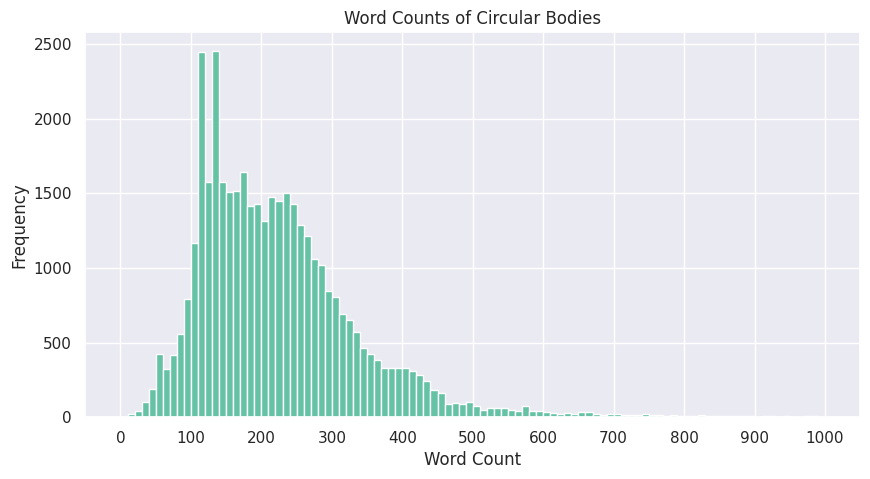

Number of circulars with > 1000 words: 318


In [7]:
'''
Get word count distribution over all circulars.
'''
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.set_theme()

counts=[]
for text in circular_bodies:
  counts.append(len(text.split()))

plt.figure(figsize=(10, 5))
plt.hist(counts, range=(0,1000), bins=100, color=sns.color_palette("Set2", 1))
plt.xlabel("Word Count")
plt.ylabel("Frequency")
plt.title("Word Counts of Circular Bodies")
plt.xticks(np.arange(0, 1001, 100))
plt.show()

counts_over_1000 = [count>1000 for count in counts]
print(f'Number of circulars with > 1000 words: {sum(counts_over_1000)}')

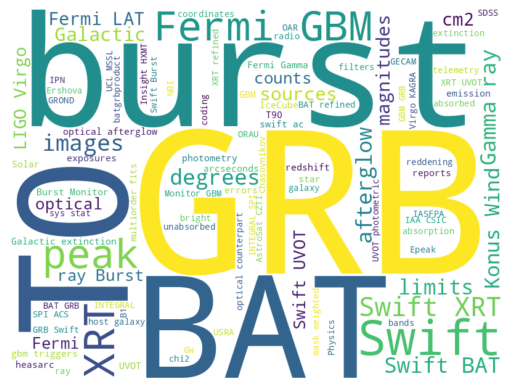

In [8]:
'''
Create word cloud over all GCN circulars.
Includes bigrams and trigrams of words.
'''
from wordcloud import WordCloud

word_cloud = WordCloud(
    collocations = True,
    background_color = 'white',
    max_words=100,
    width=800,
    height=600,
    stopwords=new_stop_words).generate(' '.join(circular_bodies))

plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [9]:
'''
Print the list of words in the word cloud
'''

word_frequencies = word_cloud.words_
words = list(word_frequencies.keys())
for word in words:
  print(word)

GRB
burst
T0
BAT
Swift
XRT
Fermi GBM
peak
Swift XRT
images
Swift BAT
Gamma ray
degrees
afterglow
limits
Konus Wind
Galactic
magnitudes
sources
Fermi LAT
cm2
LIGO Virgo
Swift UVOT
Fermi
optical
ray Burst
counts
optical afterglow
T90
photometry
swift ac
Burst Monitor
emission
exposures
GBM
heasarc
reports
Fermi Gamma
UVOT
errors
redshift
IceCube
gbm triggers
star
arcseconds
Solar
Galactic extinction
B1
bright
unabsorbed
SPI ACS
extinction
coordinates
IASFPA
optical counterpart
Swift Burst
IAA CSIC
Physics
bands
Epeak
Monitor GBM
ray
SDSS
USRA
absorption
GW
INTEGRAL SPI
IPN
host galaxy
AstroSat CZTI
reddening
telemetry
chi2
galaxy
coding
BAT refined
absorbed
BAT GRB
GBM GRB
OAR
radio
sys stat
UCL MSSL
INTEGRAL
filters
GROND
NBI
mask weighted
GRB Swift
Virgo KAGRA
ORAU
GECAM
multiorder fits
XRT refined
Ershova
Chasovnikov
XRT UVOT
batgrbproduct
Insight HXMT
UVOT photometric


#Step 5: Embed our Circulars

In [10]:
'''
Embed our circulars using the base all-MiniLM-L6-v2 model.
'''
from sentence_transformers import SentenceTransformer

# Default model. Really fast, but only has context window of 256 tokens
model = SentenceTransformer("all-MiniLM-L6-v2")
minilm_l6_embeddings = model.encode(circular_bodies, show_progress_bar=True)
np.save('minilm_l6_embeddings.npy', minilm_l6_embeddings)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1266 [00:00<?, ?it/s]

#Step 6: Perform Topic Modelling

In [11]:
'''
Initialize Llama cpp model and AutoTokenizer
'''
from transformers import AutoTokenizer
from google.colab import userdata
from huggingface_hub import login
from llama_cpp import Llama

# Huggingface login required to use Mistral 7B Instruct
# Make sure to save your own Huggingface login token in your Notebook's Secrets as 'HF_LOGIN_TOKEN'
login_token = userdata.get('HF_LOGIN_TOKEN')
login(token=login_token)

tokenizer = AutoTokenizer.from_pretrained("mistralai/Mistral-7B-Instruct-v0.2")
llm = Llama(model_path="mistral-7b-instruct-v0.2.Q4_K_M.gguf",
            n_gpu_layers=-1,
            n_ctx=32768)

tokenizer_config.json:   0%|          | 0.00/2.10k [00:00<?, ?B/s]

tokenizer.model:   0%|          | 0.00/493k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.80M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/414 [00:00<?, ?B/s]

ggml_cuda_init: GGML_CUDA_FORCE_MMQ:    no
ggml_cuda_init: GGML_CUDA_FORCE_CUBLAS: no
ggml_cuda_init: found 1 CUDA devices:
  Device 0: NVIDIA L4, compute capability 8.9, VMM: yes
llama_model_load_from_file_impl: using device CUDA0 (NVIDIA L4) - 22103 MiB free
llama_model_loader: loaded meta data with 24 key-value pairs and 291 tensors from mistral-7b-instruct-v0.2.Q4_K_M.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = mistralai_mistral-7b-instruct-v0.2
llama_model_loader: - kv   2:                       llama.context_length u32              = 32768
llama_model_loader: - kv   3:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   4:                          llama.block_count u3

In [12]:
'''
We will now perform topic modelling with BERTopic.
We use the default all-MiniLM-L6-v2 and a minimum topic size of 100 which gave the best coherence score for this model.
In addition, we will use a 4-bit quantized version of the new Mistral-7B-Instruct LLM for topic label generation.
This open sorce model has been shown to have superior performance to Llama 2 13B on multiple benchmarks.
It has been fine-tuned using publicly available conversation datasets.
'''
import time
import torch
import random
from bertopic.representation import LlamaCPP
from umap import UMAP
from hdbscan import HDBSCAN
from bertopic import BERTopic

start_time = time.time()

# Set number of threads to 1 and set other os environment variables for reproducibility
os.environ['OMP_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'
torch.set_num_threads(1)

seed_value = 42  # Set the random seed
random.seed(seed_value)
np.random.seed(seed_value)
torch.manual_seed(seed_value)
torch.cuda.manual_seed_all(seed_value)
torch.use_deterministic_algorithms(True)

# Build representation model with mistral and llama cpp
# Use a custom prompt for label generation
prompt = """Q: I have a topic that contains the following representative circulars among hundreds of others:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the above information, can you give a short label of the topic?
A: """

representation_model = LlamaCPP(model=llm,
                                prompt=prompt,
                                doc_length=768,
                                tokenizer=tokenizer,
                                pipeline_kwargs={"max_tokens": 128,
                                                 "stop": "Q:",
                                                 "temperature": 0.0})

embeddings = np.load("minilm_l6_embeddings.npy")

# Fix random state in UMAP for reproducibility
umap_model = UMAP(n_neighbors=15,
                  n_components=5,
                  min_dist=0.0,
                  metric='cosine',
                  low_memory=False,
                  random_state=0)

# Set number of cores to one to turn off multi-threading. This should help with reproducibility.
# Set minimum cluster size to 400. This will iteratively merge smaller clusters to form bigger ones.
# Set minimum samples to 10. This will make sure only clusters smaller than 10 are treated as outliers.
hdbscan_model = HDBSCAN(min_cluster_size=400,
                        min_samples=10,
                        metric='euclidean',
                        cluster_selection_method='eom',
                        prediction_data=True,
                        core_dist_n_jobs=1)

# Build Topic Model with BERTopic
topic_model = BERTopic(verbose=True,
                       umap_model=umap_model,
                       hdbscan_model=hdbscan_model,
                       vectorizer_model=vectorizer_model)
topics, probs = topic_model.fit_transform(circular_bodies, embeddings)

end_time = time.time()
print(end_time - start_time)

2025-06-15 07:42:53,160 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-06-15 07:44:08,164 - BERTopic - Dimensionality - Completed ✓
2025-06-15 07:44:08,166 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-06-15 07:44:10,125 - BERTopic - Cluster - Completed ✓
2025-06-15 07:44:10,142 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-06-15 07:44:18,913 - BERTopic - Representation - Completed ✓


88.13956904411316


In [13]:
# Display topics
freq = topic_model.get_topic_info()
freq.head(30)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,6715,-1_grb_xray_neutrino_icecube,"[grb, xray, neutrino, icecube, optical, czti, ...",[GRB 231030B: AstroSat CZTI detectionP. K. Nav...
1,0,8959,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 050730, SMARTS optical/IR afterglow obser..."
2,1,2879,1_bat_swift_burst_raj2000,"[bat, swift, burst, raj2000, decj2000, xrt, ar...",[GRB 240523A: Swift detection of a burst\nM. H...
3,2,2170,2_gbm_fermi_lat_degrees,"[gbm, fermi, lat, degrees, monitor, gammaray, ...",[GRB 210802A: Fermi GBM detectionO.J. Roberts ...
4,3,1932,3_mastersaao_masteroafa_masterkislovodsk_maste...,"[mastersaao, masteroafa, masterkislovodsk, mas...",[LIGO/Virgo S200105ae: Global MASTER-Net obser...
5,4,1903,4_swiftxrt_cm2_xrt_s1,"[swiftxrt, cm2, xrt, s1, 0310, powerlaw, xray,...",[GRB 140419A: Swift-XRT refined AnalysisA. Mas...
6,5,1785,5_swiftuvot_uvot_exposures_exps,"[swiftuvot, uvot, exposures, exps, reddening, ...",[GRB 090308: Swift/UVOT Upper LimitsF.E. Marsh...
7,6,1478,6_ligovirgo_null_galaxies_lvc,"[ligovirgo, null, galaxies, lvc, galaxy, wisea...",[LIGO/Virgo/KAGRA S250206dm: Updated NED Galax...
8,7,1409,7_konuswind_chi2_peak_burst,"[konuswind, chi2, peak, burst, ergcm2, grb, ul...",[Konus-Wind detection of GRB 250404A / EP25040...
9,8,1267,8_ibas_chandra_bepposax_xray,"[ibas, chandra, bepposax, xray, grb, svom, bur...",[GRB 241215A: A long GRB detected by INTEGRAL\...


In [14]:
# Error Analysis

document_info = topic_model.get_document_info(circular_bodies)
document_info.head()

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,Possible new SGR from US Naval ObservatoryThe ...,7,7_konuswind_chi2_peak_burst,"[konuswind, chi2, peak, burst, ergcm2, grb, ul...",[Konus-Wind detection of GRB 250404A / EP25040...,konuswind - chi2 - peak - burst - ergcm2 - grb...,0.268383,False
1,RXTE Observations of SGR 1814-13Don Smith on b...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 050730, SMARTS optical/IR afterglow obser...",optical - grb - afterglow - images - photometr...,1.000000,False
2,GRB 970828: Palomar ObservationsFor the recent...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 050730, SMARTS optical/IR afterglow obser...",optical - grb - afterglow - images - photometr...,1.000000,False
3,GRB 970228: Keck/LRIS Optical ObservationsShri...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 050730, SMARTS optical/IR afterglow obser...",optical - grb - afterglow - images - photometr...,0.752375,False
4,IRAS 18119-1342 and the possible new SGRGeorge...,0,0_optical_grb_afterglow_images,"[optical, grb, afterglow, images, photometry, ...","[GRB 050730, SMARTS optical/IR afterglow obser...",optical - grb - afterglow - images - photometr...,0.549886,False


In [15]:
'''
Apply t-SNE to reduce the dimensionality of the embeddings and visualize the clusters.
'''
from sklearn.manifold import TSNE
import plotly.graph_objects as go
import pandas as pd
import plotly.express as px
import itertools

# reduced_embeddings = UMAP(n_components=2, random_state=0).fit_transform(embeddings)
reduced_embeddings = TSNE(n_components=2, n_jobs=1, random_state=0, verbose=2).fit_transform(embeddings)

fig = go.Figure()
tsne_df = pd.DataFrame()
tsne_df["x"], tsne_df["y"] = reduced_embeddings[:, 0], reduced_embeddings[:, 1]
tsne_df["topics"] = [topic_model.topic_labels_[i] for i in topics]

unique_topics = list(topic_model.topic_labels_.values())[1:]
light24 = px.colors.qualitative.Light24
dark24 = px.colors.qualitative.Dark24
colors = light24[0:11] + [dark24[9]] + dark24[5:8] + dark24[15:17] + [dark24[13]] + [light24[22]] + [light24[17]]
color_cycle = itertools.cycle(colors)

for label in unique_topics:
    sub_df = tsne_df.loc[tsne_df["topics"] == label]
    fig.add_trace(
        go.Scattergl(
            x=sub_df["x"],
            y=sub_df["y"],
            mode="markers",
            name=str(label[label.find('_')+1:]) + " (" + str(sub_df.shape[0]) + ")",
            marker=dict(
                color=next(color_cycle),
                size=5,
                opacity=0.5,
            )
        )
    )

fig.update_traces(
  marker=dict(
    size=5,
    opacity=0.5,
  )
)

fig.update_layout(
  title={
    'text': "<b>General Coordinates Network (GCN): Key Astrophysical Topics</b>",
    'x': 0.5,
    'xanchor': 'center'
  },
  width=1200,
  height=800,
  legend_title_text="Topics (Circular Counts)",
  legend=dict(
    x=1.05,
    y=1,
    traceorder='normal',
    bgcolor='rgba(0,0,0,0)',
    bordercolor='rgba(0,0,0,0)'
  ),
  xaxis=dict(
    showticklabels=False
  ),
  yaxis=dict(
    showticklabels=False
  )
)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 40506 samples in 0.006s...
[t-SNE] Computed neighbors for 40506 samples in 6.082s...
[t-SNE] Computed conditional probabilities for sample 1000 / 40506
[t-SNE] Computed conditional probabilities for sample 2000 / 40506
[t-SNE] Computed conditional probabilities for sample 3000 / 40506
[t-SNE] Computed conditional probabilities for sample 4000 / 40506
[t-SNE] Computed conditional probabilities for sample 5000 / 40506
[t-SNE] Computed conditional probabilities for sample 6000 / 40506
[t-SNE] Computed conditional probabilities for sample 7000 / 40506
[t-SNE] Computed conditional probabilities for sample 8000 / 40506
[t-SNE] Computed conditional probabilities for sample 9000 / 40506
[t-SNE] Computed conditional probabilities for sample 10000 / 40506
[t-SNE] Computed conditional probabilities for sample 11000 / 40506
[t-SNE] Computed conditional probabilities for sample 12000 / 40506
[t-SNE] Computed conditional probabilities for sam

In [16]:
'''
Generate topic summaries with Mistral 7B Instruct and update representations
'''

topic_model.update_topics(circular_bodies,
                          representation_model=representation_model)

  0%|          | 0/25 [00:00<?, ?it/s]llama_perf_context_print:        load time =    1731.13 ms
llama_perf_context_print: prompt eval time =    1730.26 ms /  3106 tokens (    0.56 ms per token,  1795.10 tokens per second)
llama_perf_context_print:        eval time =     809.34 ms /    34 runs   (   23.80 ms per token,    42.01 tokens per second)
llama_perf_context_print:       total time =    3960.93 ms /  3140 tokens
  4%|▍         | 1/25 [00:03<01:35,  3.98s/it]Llama.generate: 24 prefix-match hit, remaining 2311 prompt tokens to eval
llama_perf_context_print:        load time =    1731.13 ms
llama_perf_context_print: prompt eval time =    1163.18 ms /  2311 tokens (    0.50 ms per token,  1986.79 tokens per second)
llama_perf_context_print:        eval time =     739.99 ms /    33 runs   (   22.42 ms per token,    44.60 tokens per second)
llama_perf_context_print:       total time =    1920.37 ms /  2344 tokens
  8%|▊         | 2/25 [00:05<01:03,  2.78s/it]Llama.generate: 27 prefix-

In [17]:
# Display topic summaries
freq = topic_model.get_topic_info()
freq.head(30)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,6715,-1_ GRB Detection and Follow-up Observations b...,[ GRB Detection and Follow-up Observations by ...,[GRB 231030B: AstroSat CZTI detectionP. K. Nav...
1,0,8959,0_ GRB Optical Afterglow Observations: Liverpo...,[ GRB Optical Afterglow Observations: Liverpoo...,"[GRB 050730, SMARTS optical/IR afterglow obser..."
2,1,2879,1_ Swift Detection of Gamma-Ray Bursts: BAT an...,[ Swift Detection of Gamma-Ray Bursts: BAT and...,[GRB 240523A: Swift detection of a burst\nM. H...
3,2,2170,"2_ Fermi GBM Observations: GRB Detections, Loc...","[ Fermi GBM Observations: GRB Detections, Loca...",[GRB 210802A: Fermi GBM detectionO.J. Roberts ...
4,3,1932,3_\nMASTER-Net Observations of Swift GRBs by M...,[\nMASTER-Net Observations of Swift GRBs by Mu...,[LIGO/Virgo S200105ae: Global MASTER-Net obser...
5,4,1903,"4_ Swift-XRT Analysis of GRBs: Light Curves, P...","[ Swift-XRT Analysis of GRBs: Light Curves, Po...",[GRB 140419A: Swift-XRT refined AnalysisA. Mas...
6,5,1785,5_ Swift/UVOT Upper Limits: Undetected Optical...,[ Swift/UVOT Upper Limits: Undetected Optical ...,[GRB 090308: Swift/UVOT Upper LimitsF.E. Marsh...
7,6,1478,6_ Gravitational Wave Detection: GOTO and ZTF ...,[ Gravitational Wave Detection: GOTO and ZTF O...,[LIGO/Virgo/KAGRA S250206dm: Updated NED Galax...
8,7,1409,"7_ Konus-Wind Observations of GRBs: Energy, Sp...","[ Konus-Wind Observations of GRBs: Energy, Spe...",[Konus-Wind detection of GRB 250404A / EP25040...
9,8,1267,8_ Chandra Detection of Fading X-ray Afterglow...,[ Chandra Detection of Fading X-ray Afterglow ...,[GRB 241215A: A long GRB detected by INTEGRAL\...


In [18]:
'''
Get table with just Topic Summaries and Frequencies
'''
sub_freq = freq[['Representation', 'Count']].copy()
sub_freq['Topic Summary'] = freq['Representation'].apply(lambda x: x[0] if isinstance(x, list) and len(x) > 0 else None)
sub_freq['Circular Count'] = freq['Count']
sub_freq.drop('Representation', axis=1, inplace=True)
sub_freq.drop('Count', axis=1, inplace=True)

In [19]:
sub_freq.drop(index=0, inplace=True) # Drop outlier row
sub_freq

,Topic Summary,Circular Count
1,GRB Optical Afterglow Observations: Liverpool...,8959
2,Swift Detection of Gamma-Ray Bursts: BAT and ...,2879
3,"Fermi GBM Observations: GRB Detections, Locat...",2170
4,\nMASTER-Net Observations of Swift GRBs by Mul...,1932
5,"Swift-XRT Analysis of GRBs: Light Curves, Pos...",1903
6,Swift/UVOT Upper Limits: Undetected Optical A...,1785
7,Gravitational Wave Detection: GOTO and ZTF Ob...,1478
8,"Konus-Wind Observations of GRBs: Energy, Spec...",1409
9,Chandra Detection of Fading X-ray Afterglow o...,1267
10,"Fermi GBM GRB Localization Data: RA, Dec, Ang...",1091


In [20]:
sub_freq.to_csv('Unsupervised_Topics.csv', index=False)

In [21]:
latex_table = sub_freq.to_latex(index=False)
latex_table

"\\begin{tabular}{lr}\n\\toprule\nTopic Summary & Circular Count \\\\\n\\midrule\n GRB Optical Afterglow Observations: Liverpool Telescope, Mondy Observatory, LBT, Lulin 40cm-SLT. & 8959 \\\\\n Swift Detection of Gamma-Ray Bursts: BAT and XRT Positions and Uncertainties. & 2879 \\\\\n Fermi GBM Observations: GRB Detections, Locations, and Spectral Analysis Results (2021-2023) & 2170 \\\\\n\nMASTER-Net Observations of Swift GRBs by Multiple Robotic Telescopes: MASTER-Kislovodsk, MASTER-IAC, MASTER-SAAO, and MASTER-Tavrida. Upper Limits and Cover Maps. & 1932 \\\\\n Swift-XRT Analysis of GRBs: Light Curves, Positions, and Spectra. & 1903 \\\\\n Swift/UVOT Upper Limits: Undetected Optical Afterglows and 3-sigma UVOT Magnitude Limits for GRBs, Uncorrected for Galactic Extinction. & 1785 \\\\\n Gravitational Wave Detection: GOTO and ZTF Observations of Optical Counterparts. & 1478 \\\\\n Konus-Wind Observations of GRBs: Energy, Spectra, and Fitting Results (20 keV - 1 MeV) & 1409 \\\\\n Cha

In [22]:
'''
Visualise topics in a 2-D space using UMAP
'''
topic_model.visualize_topics()

In [23]:
'''
Perform hierarchical reduction on our topic model.
Viualize these hierarchies to better understand the relations between our topics.
'''

hierarchical_topics = topic_model.hierarchical_topics(circular_bodies)
topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

  0%|          | 0/1 [00:00<?, ?it/s]Llama.generate: 27 prefix-match hit, remaining 2947 prompt tokens to eval
llama_perf_context_print:        load time =    1731.13 ms
llama_perf_context_print: prompt eval time =    1564.39 ms /  2947 tokens (    0.53 ms per token,  1883.81 tokens per second)
llama_perf_context_print:        eval time =    1609.48 ms /    70 runs   (   22.99 ms per token,    43.49 tokens per second)
llama_perf_context_print:       total time =    4644.33 ms /  3017 tokens

  0%|          | 0/1 [00:00<?, ?it/s]Llama.generate: 24 prefix-match hit, remaining 3219 prompt tokens to eval
llama_perf_context_print:        load time =    1731.13 ms
llama_perf_context_print: prompt eval time =    1736.77 ms /  3219 tokens (    0.54 ms per token,  1853.44 tokens per second)
llama_perf_context_print:        eval time =    2999.36 ms /   127 runs   (   23.62 ms per token,    42.34 tokens per second)
llama_perf_context_print:       total time =    7233.55 ms /  3346 tokens

  0%| 

In [24]:
'''
Visualize hierarchical topic clusters
'''
topic_model.visualize_hierarchical_documents(circular_bodies, hierarchical_topics, embeddings=embeddings, topics=list(range(20)))

In [25]:
'''
Display a Similarity Matrix for all Topics
'''
topic_model.visualize_heatmap(topics=list(range(20)), width=650, height=650)

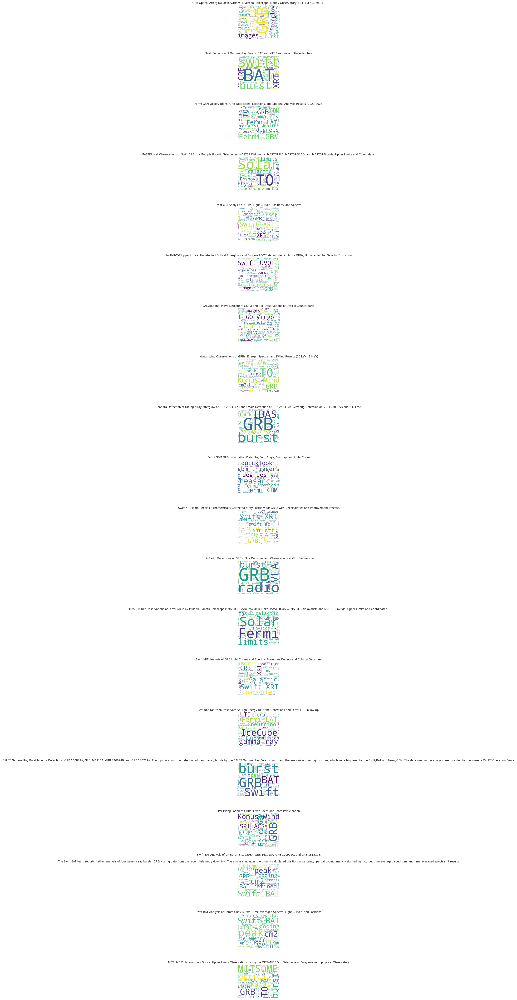

In [26]:
'''
Create word cloud over top 10 topics
'''

fig, axs = plt.subplots(20, 1, figsize=(10, 80)) # Create a figure with 10 subplots vertically arranged

# Join all documents of a topic together and generate word cloud
for topic_num, ax in enumerate(axs):
    word_cloud = WordCloud(
        collocations=True,
        background_color='white',
        max_words=100,
        width=1000,
        height=800,
        stopwords=new_stop_words).generate(' '.join([text for i, text in enumerate(circular_bodies) if topics[i] == topic_num]))

    ax.imshow(word_cloud, interpolation='bilinear')
    ax.set_title(topic_model.topic_representations_[topic_num][0][0])
    ax.axis("off")

plt.subplots_adjust(hspace=0.5)
plt.show()

#Step 7: Trend Analysis

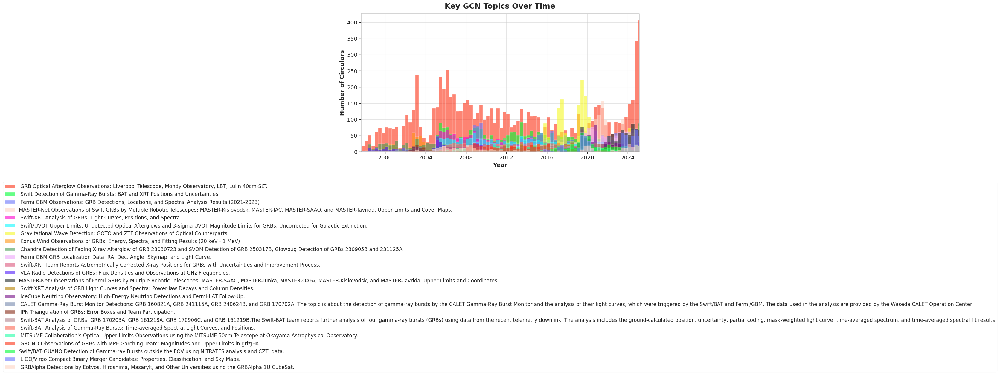

In [27]:
'''
We will now perform Trend Analysis over the topic clusters.
'''
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import itertools
from datetime import datetime

num_topics = len(freq) - 1  # Subtract 1 to exclude outlier row

sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5)

light24 = px.colors.qualitative.Light24
dark24 = px.colors.qualitative.Dark24
colors = light24[0:11] + [dark24[9]] + dark24[5:8] + dark24[15:17] + [dark24[13]] + [light24[22]] + [light24[17]]
color_cycle = itertools.cycle(colors)

fig, ax = plt.subplots(figsize=(12, 6))

for k in range(num_topics):
    topic_dates = []  # List to store dates for topic k
    all_dates = []  # List to store all dates

    # Iterate over all timestamps and check their respective document's topic
    # If topic matches k, append its timestamp (as DateTime object) to topic_dates
    for i, time_stamp in enumerate(time_stamps):
        if time_stamp == 0:  # Discard invalid dates
            continue
        if topics[i] == k:
            topic_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))  # Append datetime object to topic_dates
        all_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))

    my_bins = pd.date_range(start=min(all_dates), end=max(all_dates), freq='4M')

    # Iterate through each topic in our topic_dates dict and create histogram
    sns.histplot(topic_dates,
                 bins=mdates.date2num(my_bins),
                 alpha=0.6,
                 linewidth=0.2,
                 color=next(color_cycle),
                 ax=ax,
                 label=topic_model.topic_representations_[k][0][0].replace('\n', ''))

# Calculate the number of 6-month intervals between start and end dates
start_date = min(all_dates)
end_date = max(all_dates)
num_intervals = (end_date.year - start_date.year) * 2 + (end_date.month - start_date.month) // 6

# Calculate the adjusted end date based on the number of intervals
adjusted_end_date = start_date + pd.DateOffset(months=num_intervals * 6)

plt.xlim(start_date, adjusted_end_date)
plt.gca().xaxis.set_major_locator(mdates.YearLocator(4))
plt.xlabel("Year", fontsize=14, fontweight="bold")
plt.ylabel("Number of Circulars", fontsize=14, fontweight="bold")
plt.title("Key GCN Topics Over Time", fontsize=18, fontweight="bold", y=1.02)
plt.grid(axis="both", linestyle="-", alpha=0.5)
plt.legend(bbox_to_anchor=(0.5, -0.2), loc='upper center', fontsize=12)

plt.tight_layout()
plt.show()

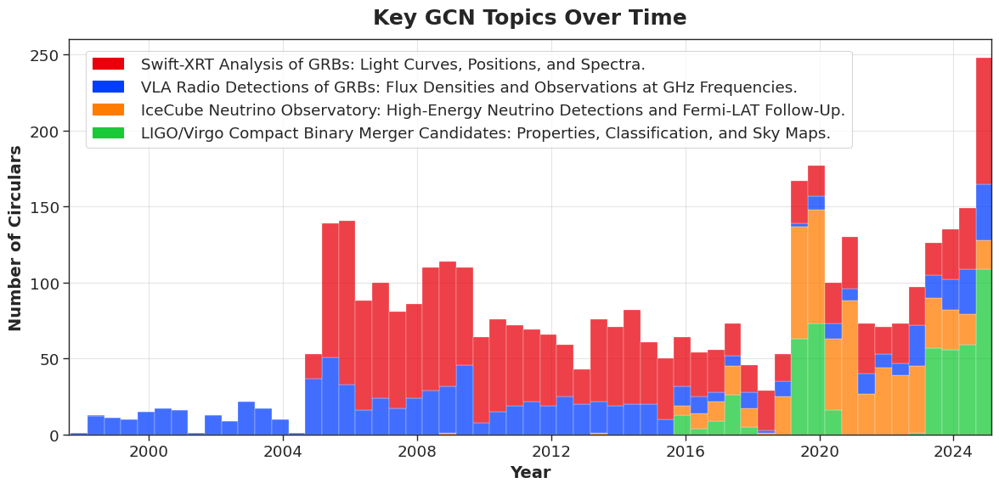

In [28]:
'''
Get histogram for some key topics
'''
from matplotlib.patches import Patch

num_topics = len(freq) - 1  # Subtract 1 to exclude outlier row
important_topics_list = [4, 11, 14, 22]

sns.set_style("whitegrid")
sns.set_style("ticks")
sns.set_context("paper", font_scale=1.5)
custom_colors = ['#e8000b', '#023eff', '#ff7c00', '#1ac938']
custom_palette =  sns.color_palette(custom_colors)
fig, ax = plt.subplots(figsize=(12, 6))

all_topic_dates = []  # List to store dates for important topics
all_dates = []  # List to store all dates

# Iterate over all timestamps and check their respective document's topic
for i, time_stamp in enumerate(time_stamps):
    if time_stamp == 0:  # Discard invalid dates
        continue
    if topics[i] in important_topics_list:
        date = datetime.utcfromtimestamp(time_stamp / 1000)
        topic = topic_model.topic_labels_[topics[i]]
        all_topic_dates.append({'Date': date, 'Topic': topic})
    all_dates.append(datetime.utcfromtimestamp(time_stamp / 1000))

topic_dates_df = pd.DataFrame(all_topic_dates)
my_bins = pd.date_range(start=min(all_dates), end=max(all_dates), freq='6M')
sns.histplot(topic_dates_df,
             x='Date',
             hue='Topic',
             multiple='stack',
             bins=mdates.date2num(my_bins),
             alpha=0.75,
             linewidth=0.2,
             palette=custom_palette)

# Calculate the number of 6-month intervals between start and end dates
start_date = min(all_dates)
end_date = max(all_dates)
num_intervals = (end_date.year - start_date.year) * 2 + (end_date.month - start_date.month) // 6

# Calculate the adjusted end date based on the number of intervals
adjusted_end_date = start_date + pd.DateOffset(months=num_intervals * 6)

plt.xlim(start_date, adjusted_end_date)
plt.gca().xaxis.set_major_locator(mdates.YearLocator(4))
plt.xlabel("Year", fontsize=14, fontweight="bold")
plt.ylabel("Number of Circulars", fontsize=14, fontweight="bold")
plt.title("Key GCN Topics Over Time", fontsize=18, fontweight="bold", y=1.02)
plt.grid(axis="both", linestyle="-", alpha=0.5)
handles = [Patch(color=custom_colors[i], label=topic_model.topic_representations_[important_topics_list[i]][0][0]) for i in range(len(important_topics_list))]
plt.legend(handles=handles, bbox_to_anchor=(0.01, 0.99), loc='upper left')

plt.tight_layout()
plt.show()
